# HCP Motor task : Scores Subtype analysis
The goal of this notebook is to run a subtype analysis on the HCP dataset and to look at the subtype weights following Pierre Orban's analysis. Here are the central research questions:

1. What are subtypes of scores maps for different networks (7 network resolution on Cambridge) and how do they look like?
2. What are the individual subject weights for these subtypes (violin plots and Pierre's matrix)
3. For which networks and subtypes is diagnosis a significant predictor of weights?
4. What do weights for these subtypes and networks look like for patients and healthy controls?

In [24]:
sebmode = False

In [115]:
# Imports
import os
import sys
import glob
import shelve
import gzip
import cPickle
import numpy as np
import pandas as pd
import nibabel as nib
#import brainbox as bb
import nilearn as nil
import statsmodels.api as sm
from scipy import stats as st
from matplotlib import gridspec
from scipy import cluster as scl
from nilearn import plotting as nlp
from matplotlib import pyplot as plt
from sklearn import linear_model as slin
from statsmodels.sandbox import stats as sts
from matplotlib.colors import LinearSegmentedColormap
if sebmode:
    import brainbox as bb

In [26]:
%matplotlib inline

# Paths

In [27]:
# Paths
subtypes = 5
tpl = 'HCP{}_session1_moRL_stability_maps.nii.gz'
prior_path = './template_partition.nii.gz'
data_path = './stability_maps_MOTOR_nii/'
pheno_path = './RESTRICTED_yassinebha_1_6_2015_14_22_6.csv'
mask_path = './func_mask_group_stereonl.nii.gz'
out_path = './sc7/'

In [28]:
# Get the mask
m_img = nib.load(mask_path)
mask_data = m_img.get_data()
mask = mask_data != 0
print('NVoxels = {}'.format(np.sum(mask)))

NVoxels = 228446


In [29]:
# Get the phenotype data
pheno = pd.read_csv(pheno_path)
pheno.head()

,Subject,Age_in_Yrs,Twin_Stat,Zygosity,Mother_ID,Father_ID,Race,Ethnicity,Handedness,SSAGA_Employ,...,SSAGA_Times_Used_Illicits,SSAGA_Times_Used_Cocaine,SSAGA_Times_Used_Hallucinogens,SSAGA_Times_Used_Opiates,SSAGA_Times_Used_Sedatives,SSAGA_Times_Used_Stimulants,SSAGA_Mj_Use,SSAGA_Mj_Ab_Dep,SSAGA_Mj_Age_1st_Use,SSAGA_Mj_Times_Used
0,100307,27,Twin,NotMZ,51488,81352,White,Not Hispanic/Latino,95,2,...,0,0,0,0,0,0,1,0,2,1
1,100408,33,Twin,MZ,51730,81594,White,Not Hispanic/Latino,55,2,...,4,5,5,5,0,0,1,1,2,4
2,101006,35,Twin,MZ,51283,81149,Black or African Am.,Not Hispanic/Latino,90,2,...,0,0,0,0,0,0,1,0,2,5
3,101107,22,NotTwin,NotTwin,51969,81833,White,Not Hispanic/Latino,5,2,...,0,0,0,0,0,0,0,0,NaN,0
4,101309,29,NotTwin,NotTwin,52385,82248,Black or African Am.,Not Hispanic/Latino,45,2,...,0,0,0,0,0,0,0,0,NaN,0


In [30]:
#Drop subjects without correesponding ID in the phenotypic file
drop_id = list()
path_list = list()
pheno = pd.read_csv(pheno_path)
for index, r in pheno.iterrows():
    s_path = glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))
    if s_path:
        continue
    else:
        print("subject {} doesnt have a file").format(r['Subject'])
        drop_id.append(index)
clean_pheno = pheno.drop(drop_id)

subject 104012 doesnt have a file
subject 105923 doesnt have a file
subject 111514 doesnt have a file
subject 116120 doesnt have a file
subject 116322 doesnt have a file
subject 121719 doesnt have a file
subject 126931 doesnt have a file
subject 128329 doesnt have a file
subject 129432 doesnt have a file
subject 129533 doesnt have a file
subject 131621 doesnt have a file
subject 140420 doesnt have a file
subject 143527 doesnt have a file
subject 144428 doesnt have a file
subject 146129 doesnt have a file
subject 153732 doesnt have a file
subject 156334 doesnt have a file
subject 175540 doesnt have a file
subject 179043 doesnt have a file
subject 192641 doesnt have a file
subject 197449 doesnt have a file
subject 197651 doesnt have a file
subject 197954 doesnt have a file
subject 203721 doesnt have a file
subject 207628 doesnt have a file
subject 208428 doesnt have a file
subject 211114 doesnt have a file
subject 230926 doesnt have a file
subject 235128 doesnt have a file
subject 287248

In [31]:
# Droppped subjects
len(drop_id)

50

In [32]:
# Kept subjects
len(clean_pheno.index)

492

In [33]:
# Grab the corresponding file paths - should be sure that they exist
path_list = [glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))[0] for i, r in clean_pheno.iterrows()]

In [34]:
# Get the prior
p_img = nib.load(prior_path)
prior = p_img.get_data()

# Define some functions and the niak colormap

In [136]:
def save_envirement(filename=None):
    direct, name = os.path.split(filename)
    if not filename:
        filename ='/tmp/shelve.out'
        print 'envirement will be saved at {}'.format(filename)
    elif not os.path.exists(direct):
        print 'Warning: this path "{}" does not exist, we willl save the envirement at {}'.format(filename,'/tmp/shelve.out')
        filename ='/tmp/shelve.out'
        
    my_shelf = shelve.open(filename,'n') # 'n' for new
    for key in dir():
        try:
            my_shelf[key] = globals()[key]
        except KeyError:
            #
            # __builtins__, my_shelf, and imported modules can not be shelved.
            #
            print('ERROR shelving: {0}'.format(key))
    my_shelf.close()

In [121]:
def load_envirement(filename):
    import shelve
    if os.path.isfile(filename):
        my_shelf = shelve.open(filename)
        for key in my_shelf:
            globals()[key] = my_shelf[key]
        my_shelf.close()
    else:
        print('ERROR: file {} not found'.format(filename))


In [35]:
# Define a new colormap
cdict = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 1.0, 1.0),
                   (0.25, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'blue':  ((0.0, 1.0, 1.0),
                   (0.25, 1.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
hotcold = LinearSegmentedColormap('hotcold', cdict)

In [36]:
def show_subtype(net_id, sbt_id, gdavg_img, sbt_store,
                 sbt_store_demeaned, view_mode='x', threshold=0.1, 
                 view_range=[-70,-50, -30, -10, 10, 30, 50, 70]):
    # Show the subtype
    fig = plt.figure(figsize=(24,50))
    gs = gridspec.GridSpec(12, 2, hspace=0.3)

    ax1 = fig.add_subplot(gs[0,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img, net_id), cmap=plt.cm.gnuplot, 
                             axes=ax1, colorbar=False, title='Scores average network {}'.format(net_id+1),
                            vmin=0, vmax=1)

    ax2 = fig.add_subplot(gs[0,1])
    # Turn the vectorized subtype into a volume
    sbt = sbt_store[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt
    sbt_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_glass_brain(sbt_img, cmap=plt.cm.gnuplot, 
                         axes=ax2, colorbar=True, title='Subtype {} network {}'.format(sbt_id+1, net_id+1),
                        vmin=0, vmax=1)
    
    ax3 = fig.add_subplot(gs[1,:])
    # Turn the vectorized demeaned subtype into a volume
    sbt_dm = sbt_store_demeaned[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt_dm
    sbt_dm_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_stat_map(sbt_dm_img, axes=ax3, display_mode=view_mode, threshold=threshold, 
                      cut_coords=view_range, black_bg=True)
    
    return fig

In [37]:
def report_weights(net_id, sbt_id, sub_asd, sub_tdc, weight_store):
    # Look at the weights for subtype 5
    sbt_weights = weight_store[net_id, sbt_id,:]
    # Get the weights for the asd and tdc cases
    asd_weights = sbt_weights[sub_asd]
    tdc_weights = sbt_weights[sub_tdc]
    n_asd = np.sum(sub_asd)
    n_tdc = np.sum(sub_tdc)
    # T-test
    [t,p] = st.ttest_ind(asd_weights, tdc_weights)

    fig = plt.figure(figsize=(8,4))
    ax1 = fig.add_subplot(121)
    # Indices
    ind_asd = np.ones(n_asd) + (np.random.random(n_asd)*2-1)*0.05
    ind_tdc = np.ones(n_tdc) + (np.random.random(n_tdc)*2-1)*0.05 + 1

    ax1.plot(ind_asd, asd_weights, 'k.')
    ax1.plot(ind_tdc, tdc_weights, 'k.')
    ax1.boxplot([asd_weights, tdc_weights])
    ax1.set_xticklabels(['ASD', 'TDC'], rotation=60)
    ax1.set_ylabel('weights')

    ax2 = fig.add_subplot(122)
    tmp = ax2.violinplot([asd_weights, tdc_weights])
    ax2.set_xticks([1,2])
    ax2.set_xticklabels(['ASD', 'TDC'], rotation=60)

    fig.suptitle('T-Test: T {:.2f}, p {:.4f}'.format(t,p))
    return fig

## Build the subtypes and compute the weights

In [158]:
# Generate the model matrix
factors = ['Age_in_Yrs','Handedness','BMI']
'''# Make dummy variables for the site factor
site_factor = pd.get_dummies(pheno['SITE_ID'])
# Turn the first site into the intercept
site_factor = site_factor.rename(columns={site_factor.keys()[0]: 'INTERCEPT'})
site_factor['INTERCEPT'] = 1
'''
# Get the other variables
other_factors = clean_pheno.ix[:,factors]
# Turn diagnosis into [0,1] vector
#other_factors['DX_GROUP'] = other_factors['DX_GROUP'].values - 1
# Demean age
#other_factors['Age_in_Yrs'] = other_factors['Age_in_Yrs']-np.mean(other_factors['Age_in_Yrs'].values)
# Put them back together
glm_pheno = other_factors

In [159]:
glm_pheno.head()

,Age_in_Yrs,Handedness,BMI
0,27,95,22.96
1,33,55,27.75
2,35,90,30.27
3,22,5,21.13
4,29,45,22.20


In [40]:
# Run over all subtypes and networks
scale = 7
subtypes = 5

In [41]:
# Run over all subtypes and networks
n_vox = np.sum(mask)
n_files = len(path_list)
# Let's run the model again for all networks and subtypes
gdavg = np.zeros(mask.shape + (scale,))
pval_store = np.zeros((scale, subtypes))
weight_store = np.zeros((scale, subtypes, n_files))
sbt_store = np.zeros((scale, subtypes, n_vox))
sbt_store_2 = np.zeros((scale, subtypes, n_vox))
corr_store = np.zeros((n_files, n_files, scale))
link_store = np.zeros((n_files-1,4,scale))
part_store = np.zeros((scale, n_files))
res_store = list()

In [42]:
if sebmode:
    timer = bb.tools.Counter(scale)
for net_id in range(scale):
    if sebmode:
        timer.tic()
    res_list = list()
    # Get the scores maps into a voxel by subject array
    # Init store
    net_stack = np.zeros((n_vox, n_files))
    # Iterate files
    for index, s_path in enumerate(path_list):
        # Getting data
        tmp = nib.load(s_path).get_data()
        #tmp = np.swapaxes(np.swapaxes(tmp, 0, 3), 1, 2)
        f_net = tmp[mask][..., net_id]
        net_stack[..., index] = f_net
        if not sebmode:
            sys.stdout.write('\r Loaded {} of {} for network {}'.format(index+1, n_files, net_id+1))
            sys.stdout.flush()
        
    grand_average = np.reshape(np.mean(net_stack, 1), (net_stack.shape[0], 1))
    # Save a copy of the non-demeanded net stack
    net_stack_2 = np.copy(net_stack)
    # Demean the net stack
    net_stack = net_stack - grand_average
    # Save the grand average
    tmpl = np.zeros_like(mask, dtype=np.float16)
    tmpl[mask] = grand_average[:, 0]
    gdavg[..., net_id] = tmpl
    
    # Build correlation matrix on the network stack
    corr_mat = np.corrcoef(net_stack, rowvar=0)
    # Compute linkage with Ward's criterion
    link_mat = scl.hierarchy.linkage(corr_mat, method='ward')
    # Store both
    corr_store[..., net_id] = corr_mat
    link_store[..., net_id] = link_mat
    # Partition the linkage to get a given number of subtypes
    part_sub = scl.hierarchy.fcluster(link_mat, subtypes, criterion='maxclust')
    part_store[net_id, :] = part_sub
    
    # Init store - Build subtypes
    sub_stack = np.zeros((n_vox, subtypes))
    for s_id in range(subtypes):
        sbt = np.mean(net_stack[:, part_sub==s_id+1],1)
        sub_stack[:,s_id] = sbt
        sbt_store[net_id, s_id, :] = sbt
    
    # Make the non-demeaned subtypes
    for s_id in range(subtypes):
        sbt = np.mean(net_stack_2[:, part_store[net_id, :]==s_id+1],1)
        sbt_store_2[net_id, s_id, :] = sbt

    # Init store - Compute the weights
    for s_id in range(subtypes):
        type_map = sub_stack[:, s_id]
        weight_store[net_id, s_id, :] = np.array([np.corrcoef(type_map, net_stack[:,x])[0,1] for x in range(n_files)])
        
    if sebmode:
        timer.toc()
        timer.progress()

 Loaded 492 of 492 for network 7

In [160]:
cov = 'BMI'
res_store = list()
pval_store = np.zeros((scale, subtypes))
for net_id in range(scale):
    res_list = list()
    # Loop through the subtypes
    for s_id in range(subtypes):
        model = sm.OLS(weight_store[net_id, s_id, :], glm_pheno)
        results = model.fit()
        # Save the p-values
        pval_store[net_id, s_id] = results.pvalues[cov]
        res_list.append(results)
    res_store.append(res_list)

# Look at the results

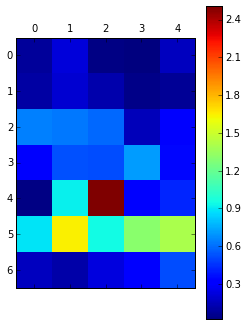

In [161]:
# Look at the uncorrected p-values for the GLM with diagnosis across networks
tmp = plt.matshow(-np.log10(pval_store))
tmp = plt.colorbar()

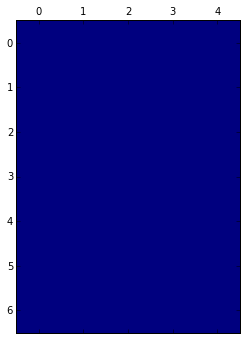

In [162]:
# Now look at the mask of p-values passing FDR Correction
pval_vec = np.reshape(pval_store, np.prod(pval_store.shape))
pcorr_vec = sts.multicomp.fdrcorrection0(pval_vec, 0.05)
pcorr_store = np.reshape(pcorr_vec[0], pval_store.shape)
tmp = plt.matshow(pcorr_store)

In [47]:
# Find the subjects that are ASD (1) and controls (2)
sub_asd = pheno['DX_GROUP'].values == 1
sub_tdc = pheno['DX_GROUP'].values == 2

KeyError: 'DX_GROUP'

In [46]:
# Find the p-values passing FDR (from the above mask)
np.argwhere(pcorr_store)

NameError: name 'pcorr_store' is not defined

## Overview of subtypes across all networks

In [163]:
# Turn the grand average into an image
gdavg_img = nib.Nifti1Image(gdavg, affine=m_img.get_affine(), header=m_img.get_header())

In [164]:
# Turn the priors into an image
tmp_prior = nib.load(prior_path).get_data()

In [165]:
# Turn the priors into an image
prior = nib.load(prior_path)
prior_data = prior.get_data()
prior_temp = np.zeros((prior_data.shape + (scale,)))
for sc_id in range(scale):
    tmp = np.zeros_like(prior_data)
    tmp[prior_data==sc_id+1] = sc_id + 1
    prior_temp[..., sc_id] = tmp
prior_img = nib.Nifti1Image(prior_temp, affine=m_img.get_affine(), header=m_img.get_header())

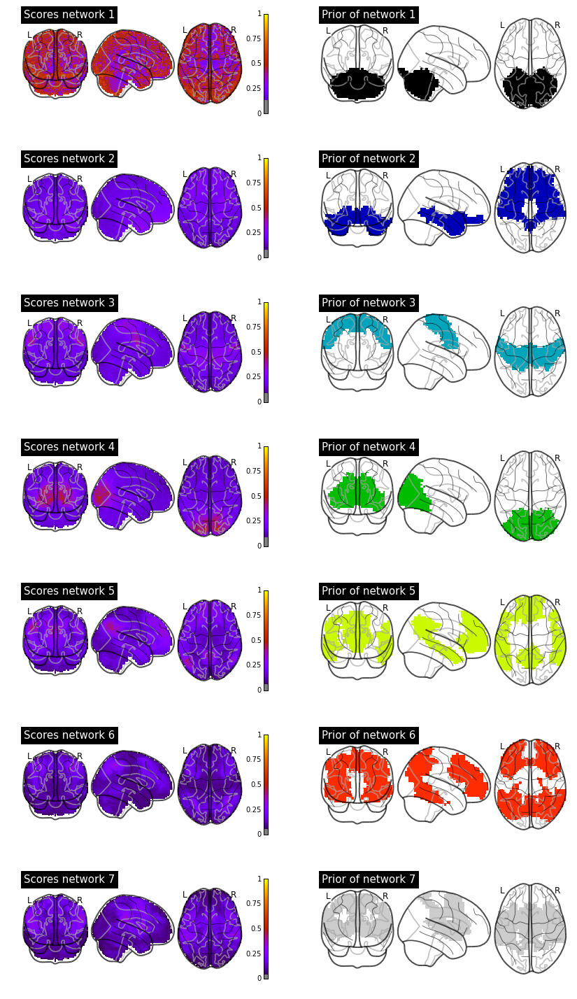

In [166]:
fig = plt.figure(figsize=(14,25))
gs = gridspec.GridSpec(7, 2, hspace=0.3)
for s_id in np.arange(0,7):
    ax1 = fig.add_subplot(gs[s_id,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img,s_id), cmap=plt.cm.gnuplot, 
                         axes=ax1, colorbar=True, title='Scores network {}'.format(s_id+1),
                        vmin=0, vmax=1)
    ax2 = fig.add_subplot(gs[s_id,1])
    nlp.plot_glass_brain(nil.image.index_img(prior_img,s_id), cmap=plt.cm.spectral, 
                         axes=ax2, colorbar=False, title='Prior of network {}'.format(s_id+1),
                        vmin=1, vmax=7)

## Network 1

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        16:59:53   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

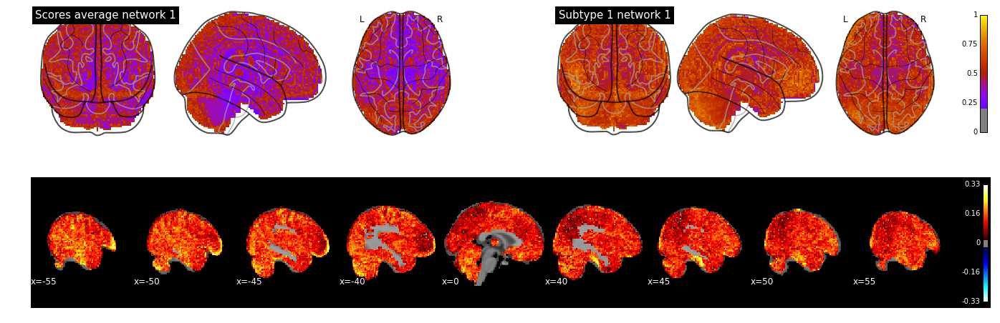

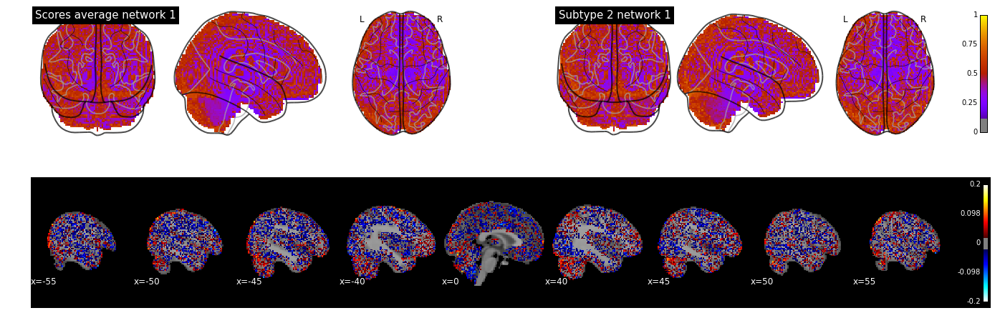

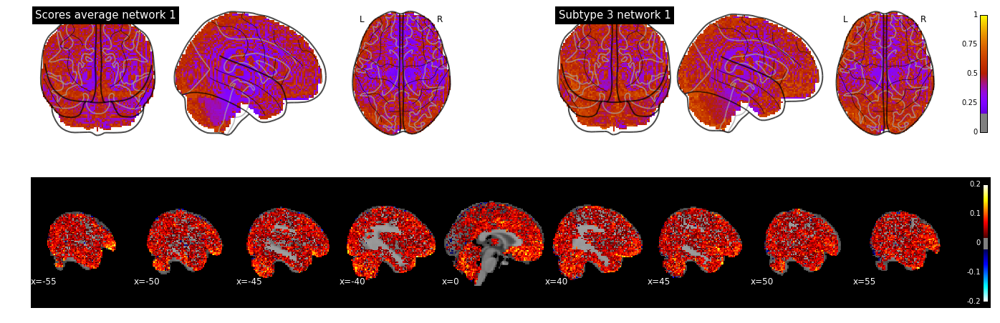

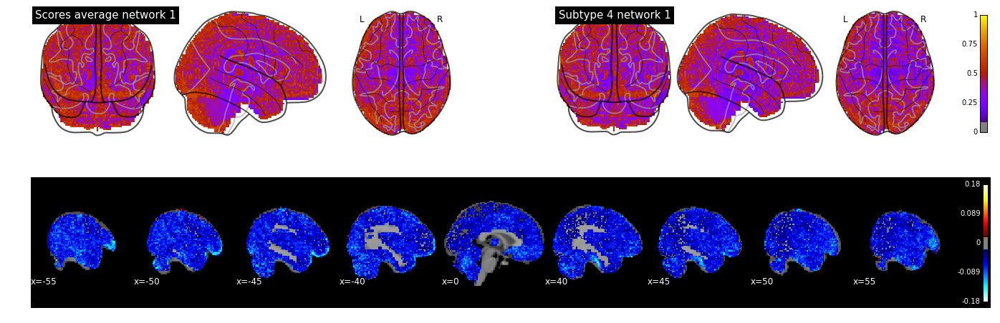

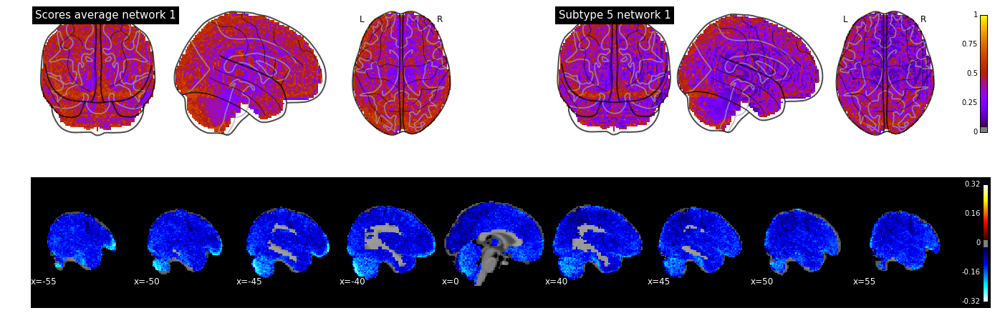

In [167]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 2

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:00:12   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

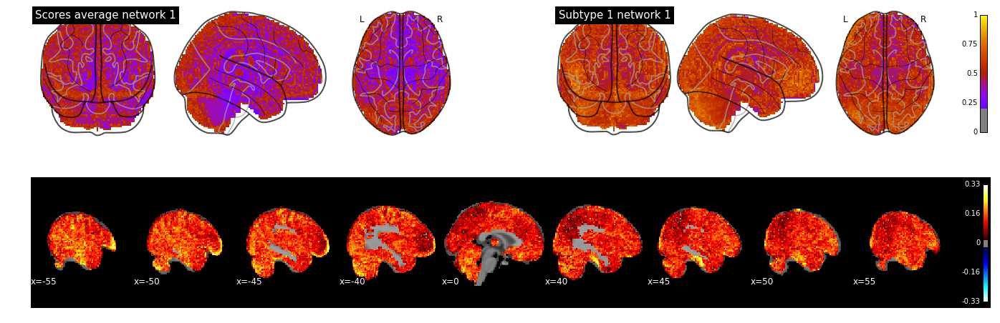

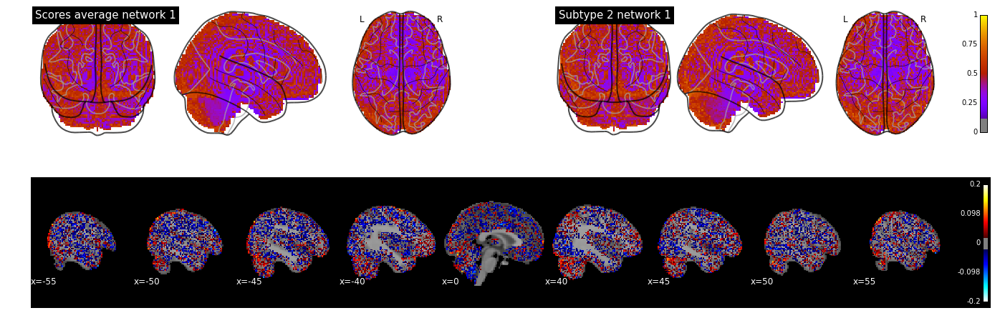

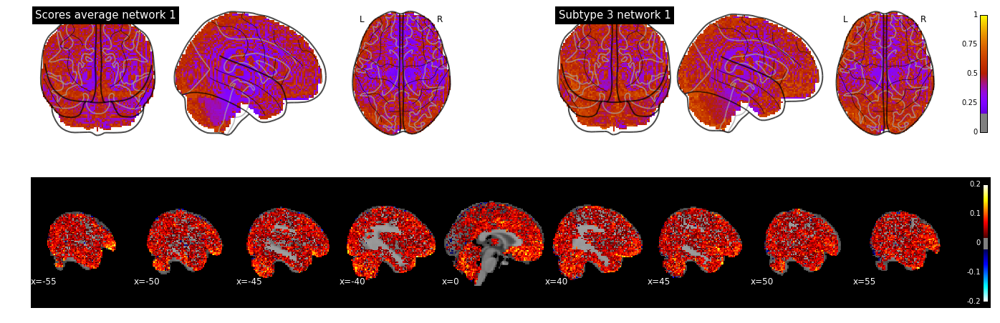

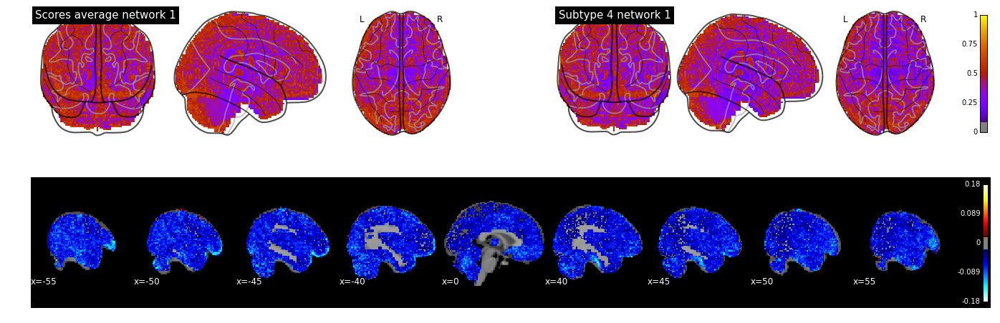

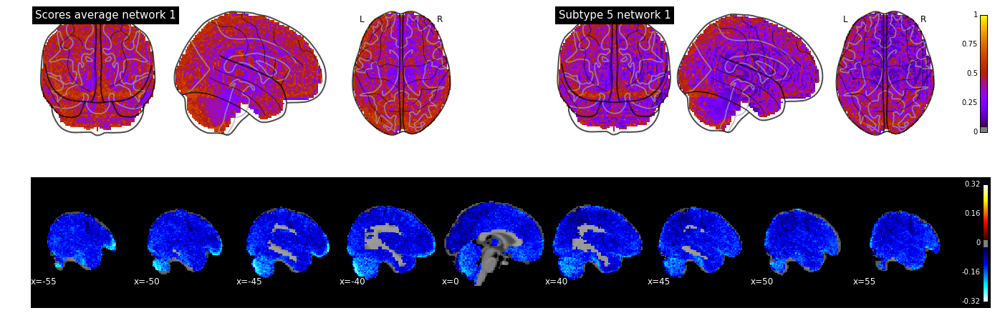

In [168]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 3

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:00:32   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

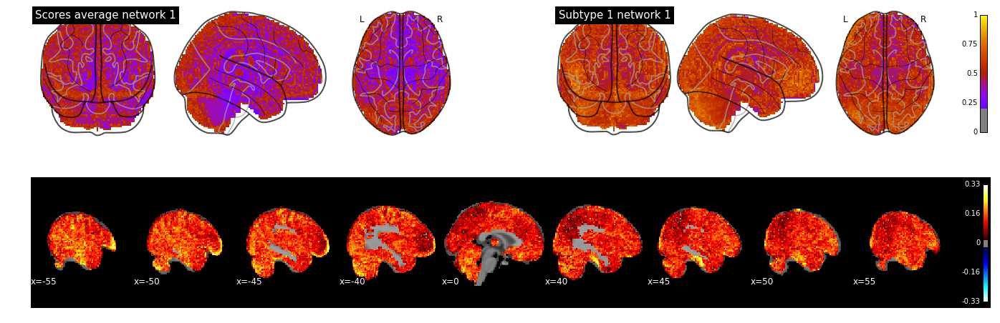

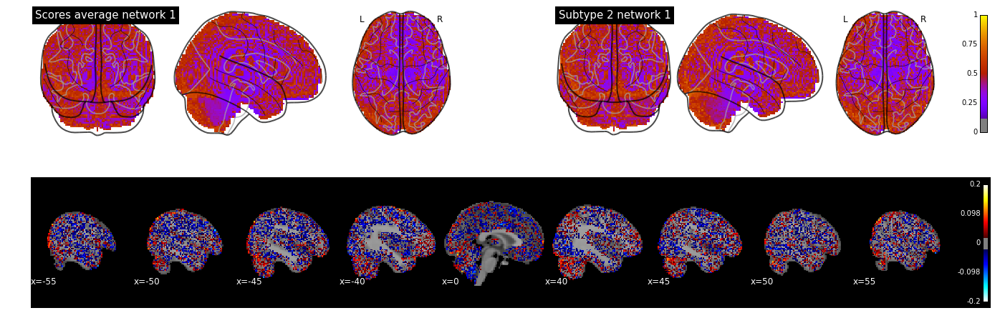

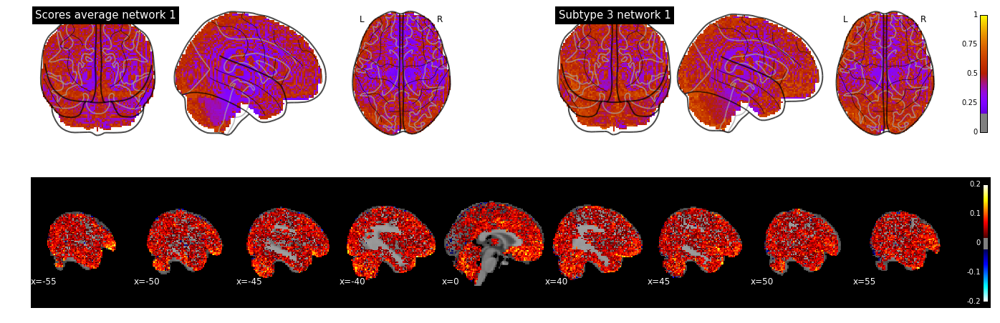

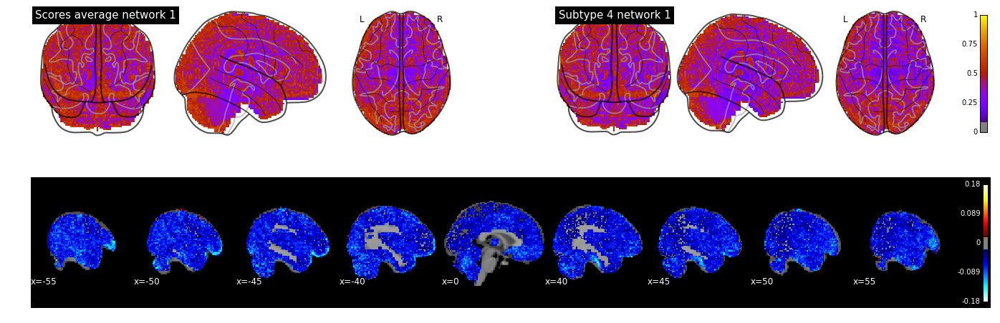

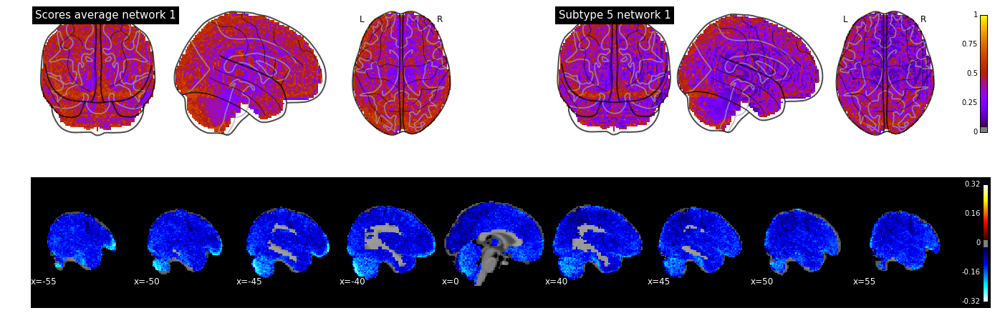

In [169]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 4

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:00:52   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

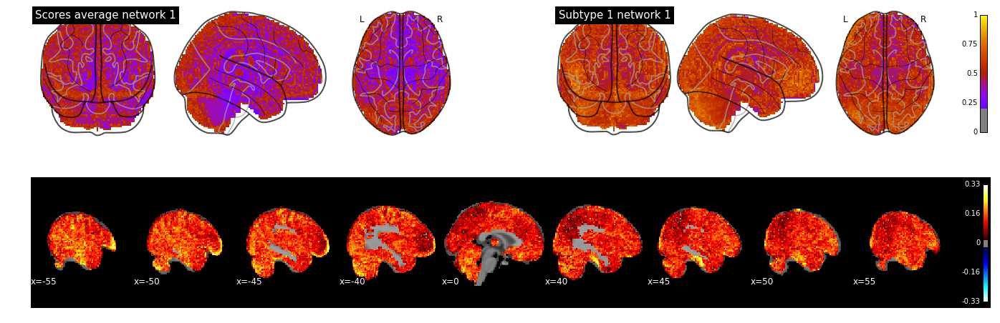

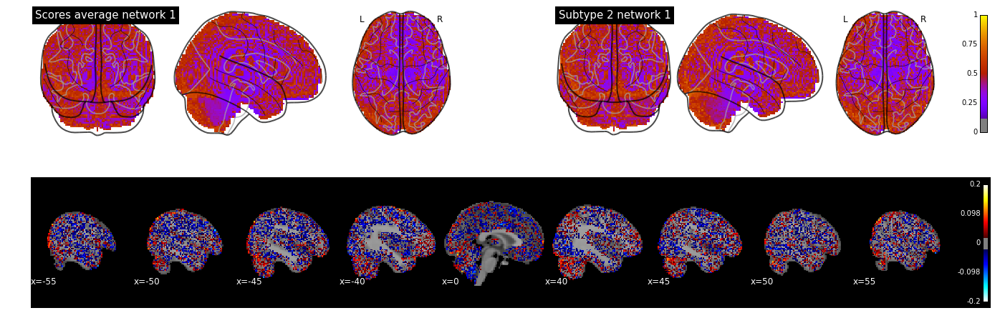

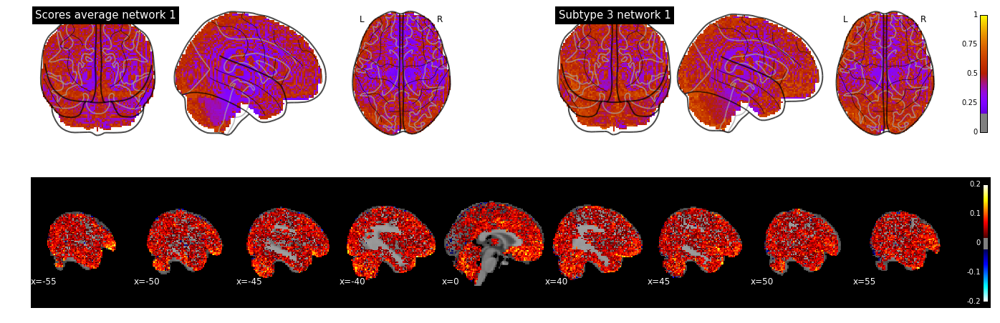

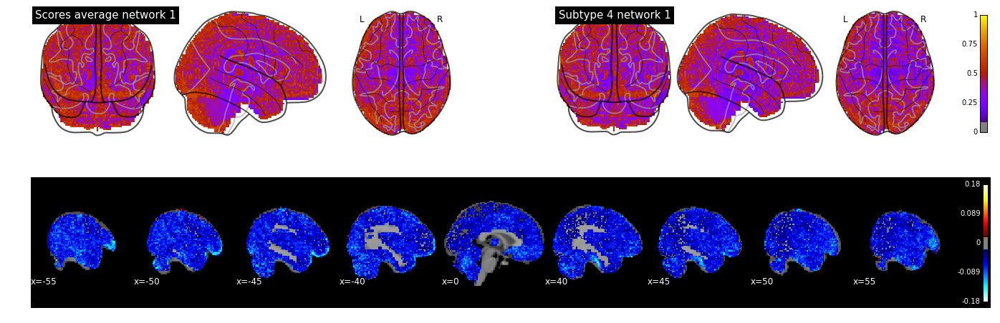

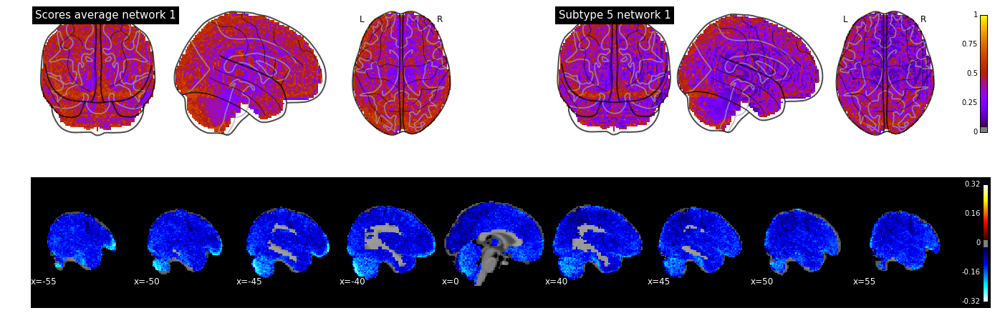

In [170]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 5

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:01:11   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

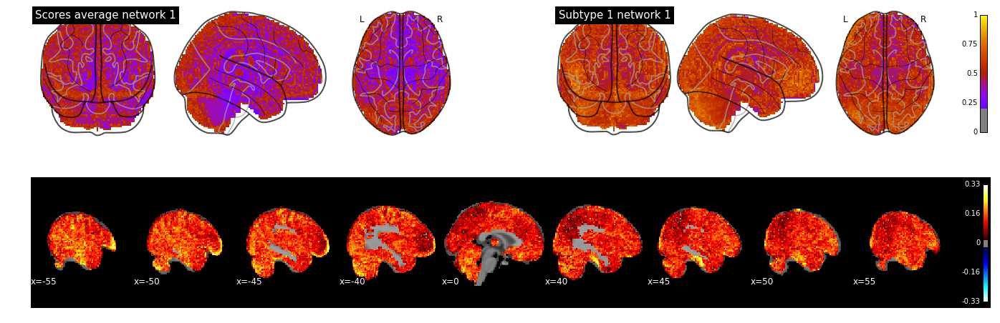

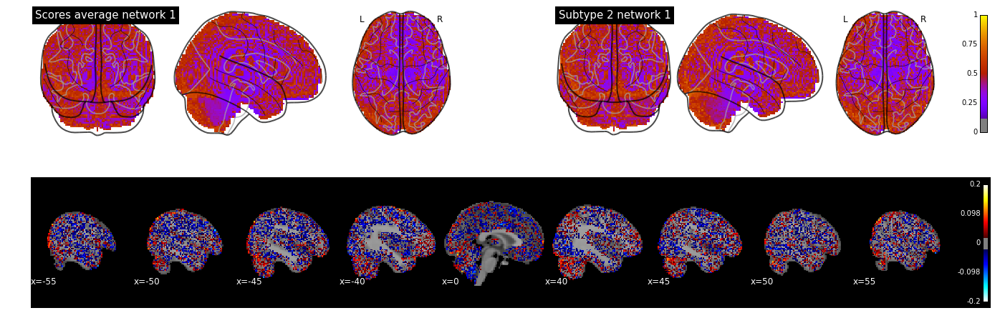

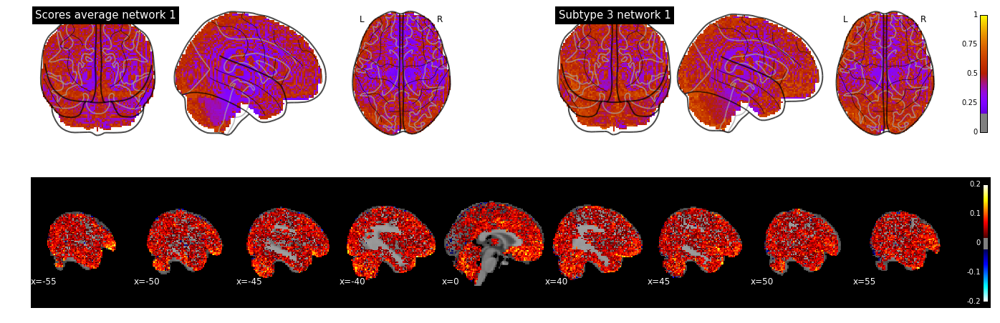

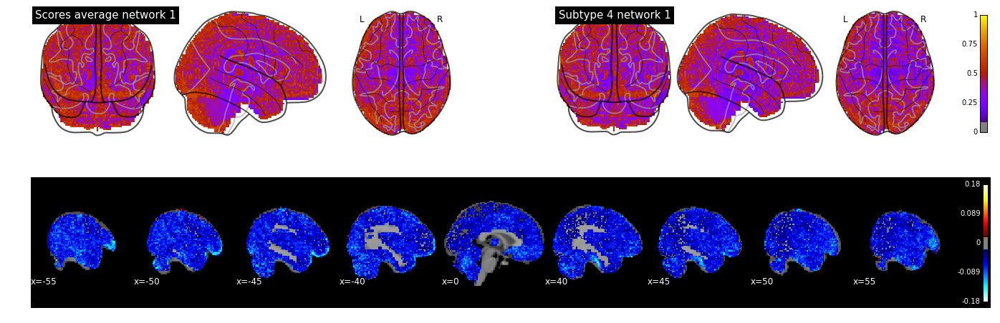

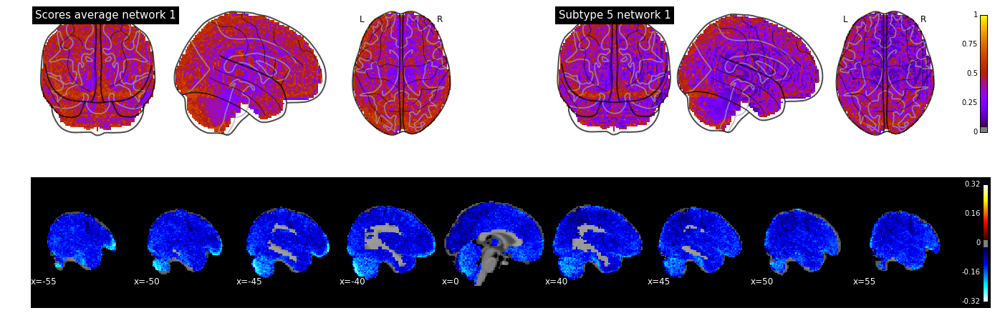

In [171]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 6

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:01:31   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

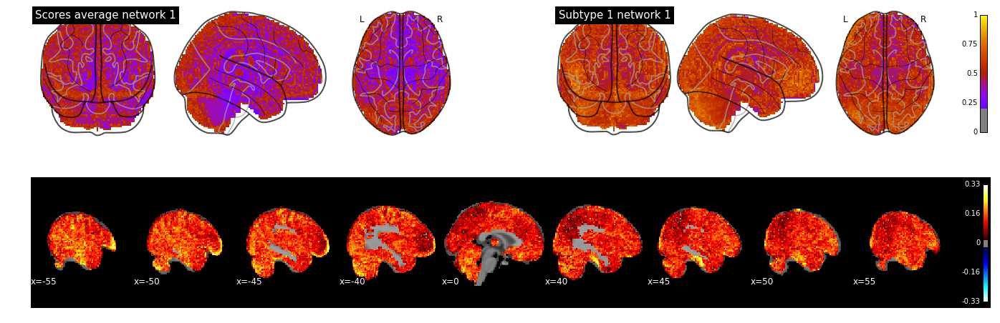

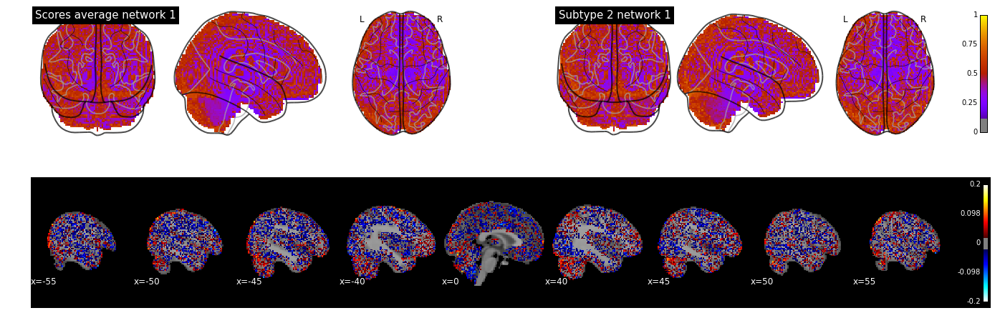

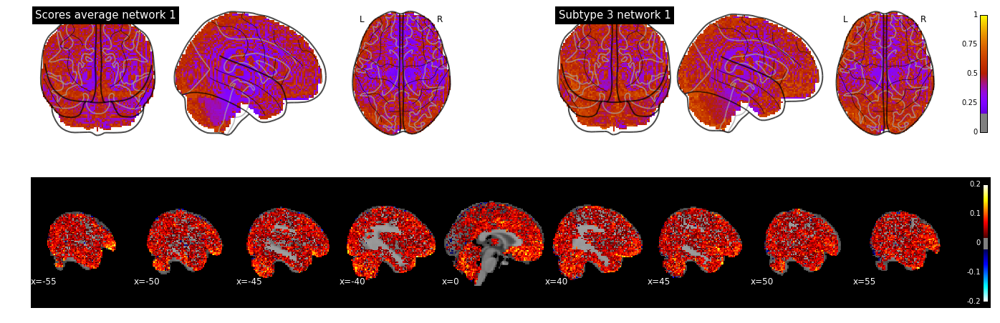

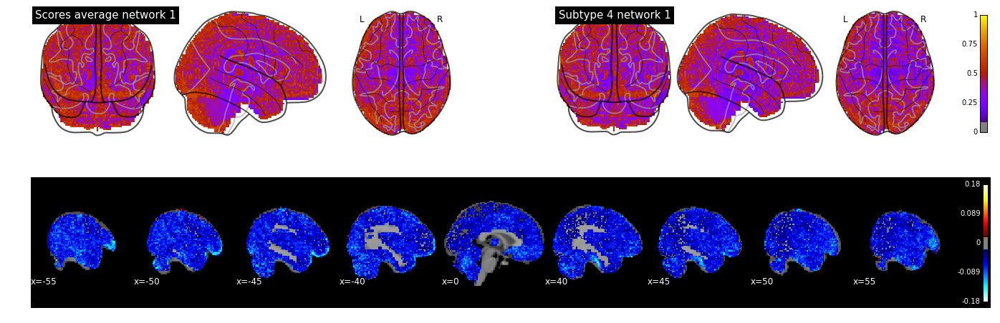

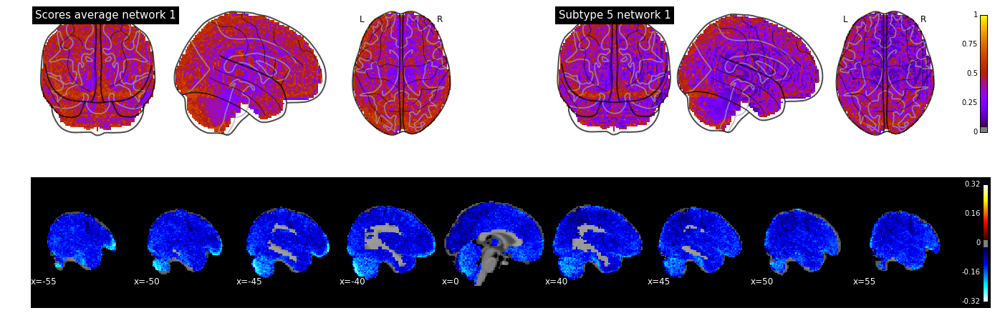

In [172]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 7

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     9.124
Date:                Fri, 06 Nov 2015   Prob (F-statistic):           6.94e-06
Time:                        17:01:50   Log-Likelihood:                 245.94
No. Observations:                 492   AIC:                            -485.9
Df Residuals:                     489   BIC:                            -473.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
Age_in_Yrs    -0.0007      0.001     -0.698      0.4

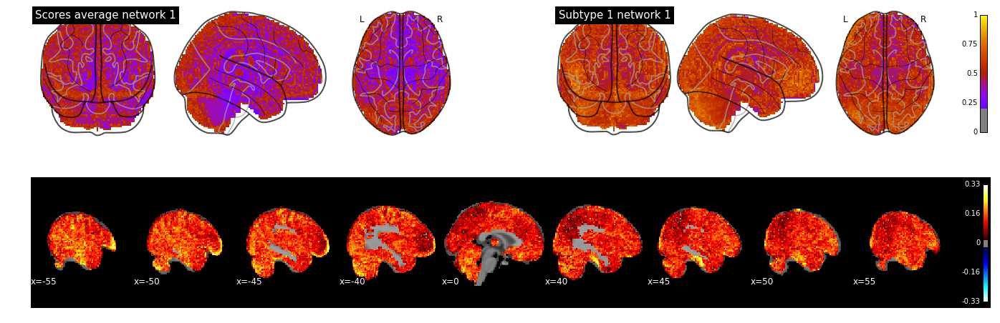

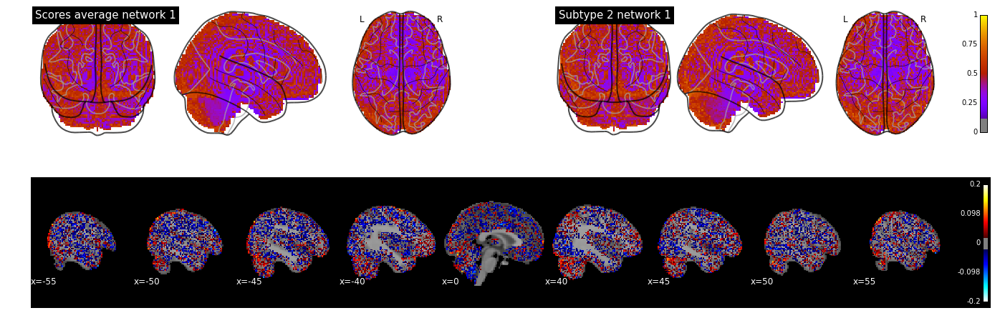

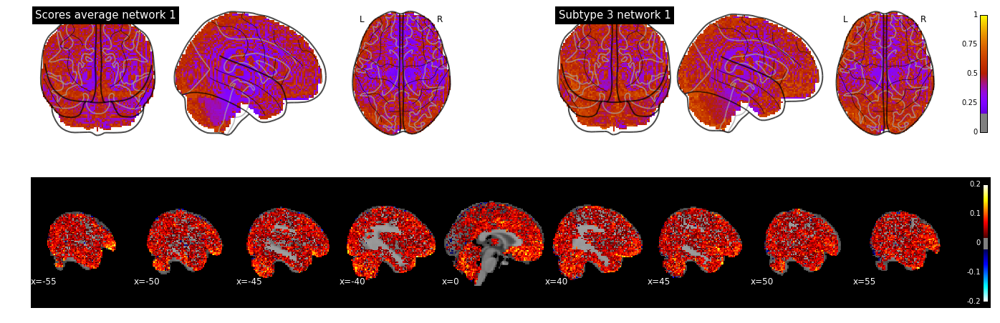

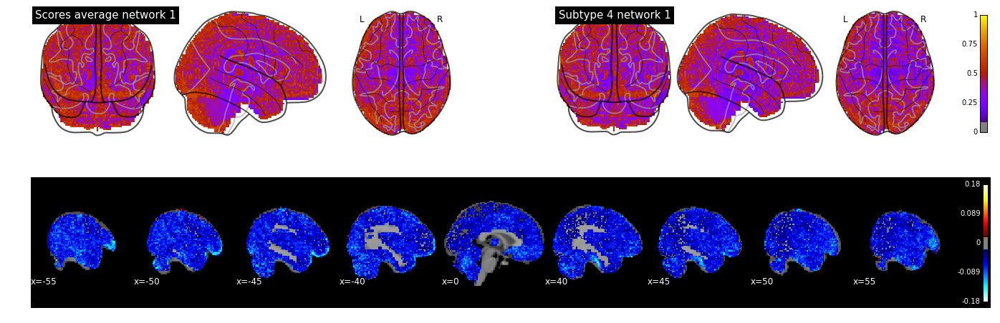

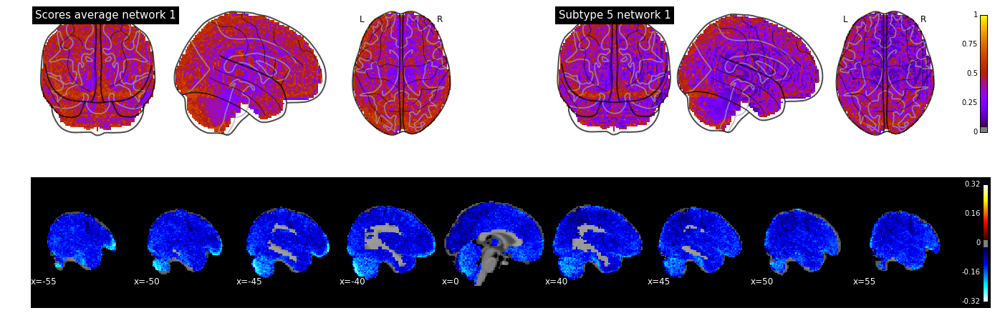

In [173]:
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())